In [4]:
cd ../

/Users/sowonjeong/Documents/GitHub/GNN-Geometry


In [5]:
import matplotlib.pyplot as plt
import torch
from models.grace import *
from models.train_models import train_grace
from models.baseline_models import *
from simulation_utils.helix import *
from metrics import *

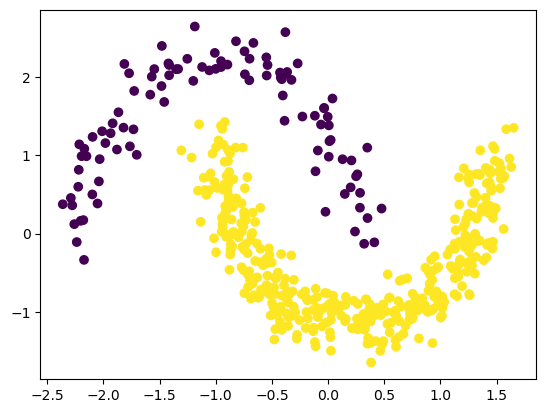

In [6]:
X,c, A, dataset = get_moons(n_samples=500, shuffle=True, noise=0.1, random_state= 0,
                        n_neighbours = 5, features = 'coordinates', standardize=True, ratio = 0.2)
plt.scatter(X[:,0], X[:,1], c=c)

(array([  2.,   6.,  40.,  98., 146., 258., 614., 954., 802., 184.]),
 array([0.67316565, 0.70546127, 0.73775689, 0.77005252, 0.80234814,
        0.83464376, 0.86693938, 0.89923501, 0.93153063, 0.96382625,
        0.99612187]),
 <BarContainer object of 10 artists>)

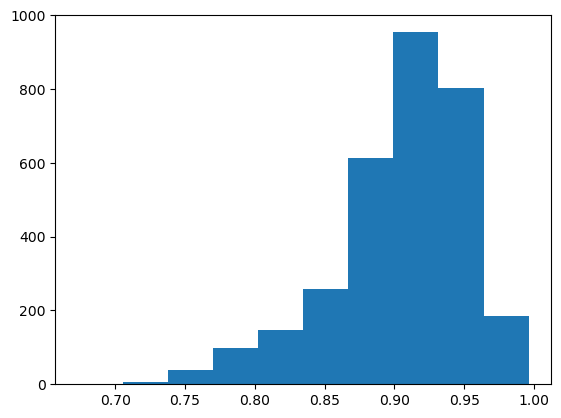

In [7]:
plt.hist(dataset.edge_weight)

In [9]:
exp = 20
circles = {}
for i in range(exp):
    X,c, A, dataset = get_circles(n_samples=500, shuffle=True, noise=0.1, random_state= i, factor=0.5,
                        n_neighbours = 30, features = 'none', standardize=True, ratio  = 0.5)
    perfect_embedding = X
    alpha = np.arange(0,1.1,0.1)
    for types in ["symmetric","RW"]:
        for j in np.arange(10):
            model = train_grace(dataset, 256, 3, n_layers=2, tau=0.5,
                        epochs=200, wd=1e-3, lr=1e-2, fmr=0.2, edr =0.5,
                        proj="standard", name_file="test", device=None,
                        gnn_type= types, alpha=alpha[j+1], beta = 1,add_self_loops= True)
            out_tmp = model.get_embedding(dataset)
            Y = out_tmp.detach().numpy()
            _,_,cor,_ = spearman_correlation_eval(perfect_embedding, out_tmp, n_points = 500)
            knn_eval = neighbor_kept_ratio_eval(dataset,out_tmp, n_neighbors = 5)
            dens = eval_density_preserve(X,Y, sigma = 1.0, min_dist = 1e-3)
            circles[types + '_' + str(alpha[j+1]) + '_' +  str(i)]  =  {'global_m': cor, 'local_m' : knn_eval, 'density': dens,
                                            'seed' : i,
                                            'gnn_type': types,
                                            'embedding' : out_tmp,
                                            'exp number': i,
                                            'alpha': alpha[j+1]}



=== train GRACE model ===
Epoch=000, loss=6.6913
Epoch=001, loss=5.5984
Epoch=002, loss=5.5799
Epoch=003, loss=5.5640
Epoch=004, loss=5.5666
Epoch=005, loss=5.5592
Epoch=006, loss=5.5635
Epoch=007, loss=5.5510
Epoch=008, loss=5.5563
Epoch=009, loss=5.5496
Epoch=010, loss=5.5487
Epoch=011, loss=5.5528
Epoch=012, loss=5.5480
Epoch=013, loss=5.5403
Epoch=014, loss=5.5435
Epoch=015, loss=5.5419
Epoch=016, loss=5.5424
Epoch=017, loss=5.5473
Epoch=018, loss=5.5435
Epoch=019, loss=5.5486
Epoch=020, loss=5.5380
Epoch=021, loss=5.5384
Epoch=022, loss=5.5380
Epoch=023, loss=5.5391
Epoch=024, loss=5.5369
Epoch=025, loss=5.5382
Epoch=026, loss=5.5339
Epoch=027, loss=5.5399
Epoch=028, loss=5.5408
Epoch=029, loss=5.5338
Epoch=030, loss=5.5363
Epoch=031, loss=5.5406
Epoch=032, loss=5.5402
Epoch=033, loss=5.5325
Epoch=034, loss=5.5406
Epoch=035, loss=5.5433
Epoch=036, loss=5.5396
Epoch=037, loss=5.5331
Epoch=038, loss=5.5384
Epoch=039, loss=5.5391
Epoch=040, loss=5.5356
Epoch=041, loss=5.5371
Epoch=04

In [ ]:
import pickle

# Store data 
with open('circle-no-feature-0505.pkl', 'wb') as file: # factor = 0.8
    # A new file will be created
    pickle.dump(circles, file)

In [41]:
tab = pd.DataFrame.from_dict(circles).T
tab.groupby(["gnn_type","alpha"])['global_m','local_m','density'].mean()

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_96509/2290380754.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  tab.groupby(["gnn_type","alpha"])['global_m','local_m','density'].mean()


global_m   local_m   density
gnn_type  alpha                              
RW        0.1    0.496336  0.145796 -0.249682
          0.2    0.518486  0.145660 -0.191867
          0.3    0.476267  0.145796 -0.124666
          0.4    0.495936  0.146254 -0.112561
          0.5    0.514489  0.146492 -0.055379
          0.6    0.492837  0.146596 -0.003468
          0.7    0.493300  0.145783  0.062436
          0.8    0.529685  0.147214  0.117130
          0.9    0.501714  0.146873  0.160503
          1.0    0.501074  0.146994  0.183707
symmetric 0.1    0.474927  0.145526 -0.088506
          0.2    0.481577  0.145911 -0.110825
          0.3    0.490251  0.146389 -0.193353
          0.4    0.495242  0.146469 -0.179997
          0.5    0.487697  0.145283 -0.103188
          0.6    0.506464  0.145703 -0.030734
          0.7    0.520314  0.146520  0.053370
          0.8    0.483720  0.145714  0.102648
          0.9    0.477678  0.144936  0.186323
          1.0    0.491664  0.145659  0.197551

In [42]:
tab.groupby(["gnn_type","alpha"])['global_m','local_m','density'].std()

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_96509/2954017120.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  tab.groupby(["gnn_type","alpha"])['global_m','local_m','density'].std()


global_m   local_m   density
gnn_type  alpha                              
RW        0.1    0.115246  0.002638  0.105348
          0.2    0.131942  0.002782  0.105606
          0.3    0.114806  0.002718  0.113282
          0.4    0.137032  0.002901  0.089028
          0.5    0.089718  0.003320  0.101757
          0.6    0.125634  0.002870  0.096242
          0.7    0.094939  0.002950  0.081306
          0.8    0.105650  0.003071  0.073559
          0.9    0.094916  0.002533  0.081987
          1.0    0.128598  0.002074  0.096874
symmetric 0.1    0.099101  0.003002  0.070909
          0.2    0.122117  0.003133  0.067005
          0.3    0.091905  0.002344  0.075757
          0.4    0.097860  0.003128  0.077715
          0.5    0.085055  0.002398  0.112954
          0.6    0.122198  0.003010  0.084586
          0.7    0.154992  0.004033  0.104438
          0.8    0.113821  0.003912  0.101958
          0.9    0.098582  0.003656  0.089504
          1.0    0.119206  0.002966  0.082789

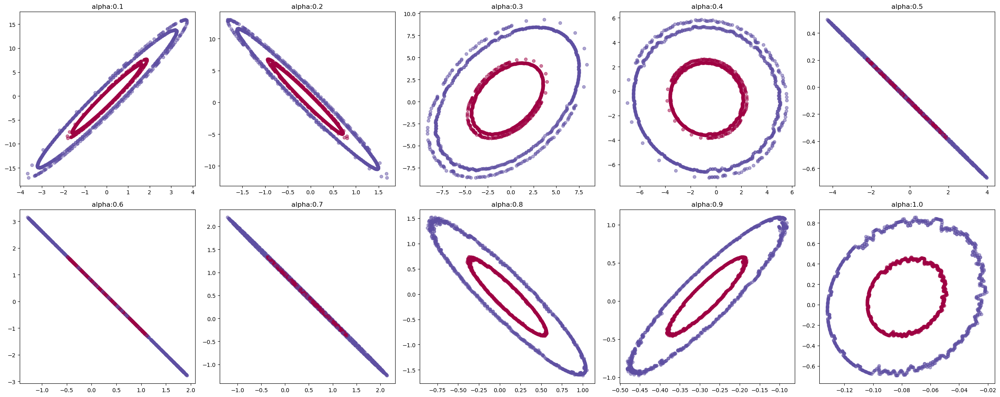

In [31]:
# row_normalized
X,c, A, dataset = get_circles(n_samples=1500, shuffle=True, noise=None, random_state= 0, factor=0.5,
                        n_neighbours = 5, features = 'coordinates', standardize=True)
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(circles['symmetric_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,0],circles['symmetric_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,1], c = c, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i+1],1)))
plt.tight_layout()
plt.show()

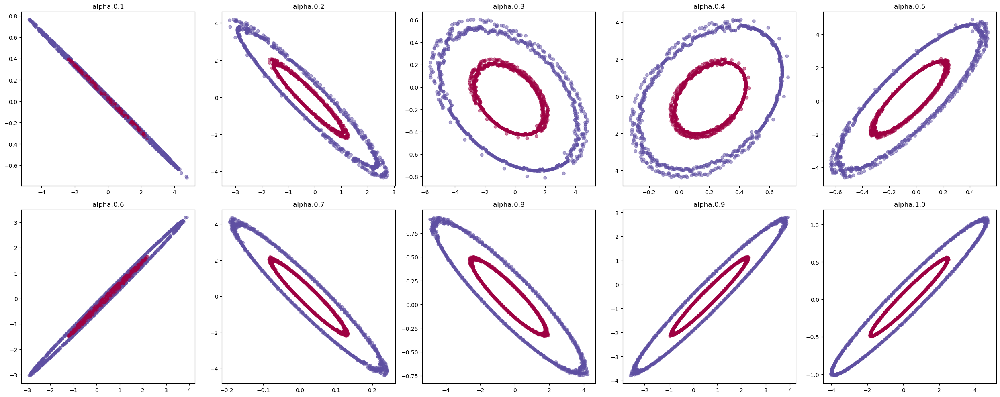

In [32]:
# row_normalized
X,c, A, dataset = get_circles(n_samples=1500, shuffle=True, noise=None, random_state= 0, factor=0.5,
                        n_neighbours = 5, features = 'coordinates', standardize=True)
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(circles['RW_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,0],circles['RW_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,1], c = c, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i+1],1)))
plt.tight_layout()
plt.show()

In [16]:
exp = 20
moons = {}
for i in range(exp):
    X,c, A, dataset = get_moons(n_samples=1500, shuffle=True, noise=None, random_state= i, 
                        n_neighbours = 5, features = 'coordinates', standardize=True, ratio = 0.8)
    perfect_embedding = X
    alpha = np.arange(0,1.1,0.1)
    for types in ["symmetric","RW"]:
        for j in np.arange(10):
            model = train_grace(dataset, 32, 2, n_layers=1, tau=0.5,
                        epochs=500, wd=1e-3, lr=1e-1, fmr=0.2, edr =0.5,
                        proj="nonlinear-hid", name_file="test", device=None,
                        gnn_type= types, alpha=alpha[j+1], beta = 1,add_self_loops= True)
            out_tmp = model.get_embedding(dataset)
            Y = out_tmp.detach().numpy()
            _,_,cor,_ = spearman_correlation_eval(perfect_embedding, out_tmp)
            knn_eval = neighbor_kept_ratio_eval(dataset,out_tmp, n_neighbors = 5)
            dens = eval_density_preserve(X,Y, sigma = 1.0, min_dist = 1e-3)
            moons[types + '_' + str(alpha[j+1]) + '_' +  str(i)]  =  {'global_m': cor, 'local_m' : knn_eval, 'density': dens,
                                            'seed' : i,
                                            'gnn_type': types,
                                            'embedding' : out_tmp,
                                            'exp number': i,
                                            'alpha': alpha[j+1]}



=== train GRACE model ===
Epoch=000, loss=6.9735
Epoch=001, loss=6.9958
Epoch=002, loss=6.9829
Epoch=003, loss=8.5840
Epoch=004, loss=6.9594
Epoch=005, loss=6.9583
Epoch=006, loss=6.9355
Epoch=007, loss=6.9183
Epoch=008, loss=8.7221
Epoch=009, loss=7.7508
Epoch=010, loss=6.9086
Epoch=011, loss=7.5940
Epoch=012, loss=7.5680
Epoch=013, loss=7.5207
Epoch=014, loss=7.7590
Epoch=015, loss=7.7706
Epoch=016, loss=7.4628
Epoch=017, loss=6.9887
Epoch=018, loss=6.9826
Epoch=019, loss=7.4588
Epoch=020, loss=6.9615
Epoch=021, loss=7.8794
Epoch=022, loss=7.4291
Epoch=023, loss=7.3919
Epoch=024, loss=8.7950
Epoch=025, loss=8.0719
Epoch=026, loss=7.9411
Epoch=027, loss=8.7514
Epoch=028, loss=7.7956
Epoch=029, loss=7.7361
Epoch=030, loss=7.0972
Epoch=031, loss=8.2406
Epoch=032, loss=7.1199
Epoch=033, loss=8.1180
Epoch=034, loss=7.1498
Epoch=035, loss=7.1815
Epoch=036, loss=7.4968
Epoch=037, loss=7.2225
Epoch=038, loss=8.2482
Epoch=039, loss=7.1964
Epoch=040, loss=7.1702
Epoch=041, loss=7.1182
Epoch=04

In [20]:
X,c, A, dataset = get_moons(n_samples=1500, shuffle=True, noise=None, random_state= 3, 
                        n_neighbours = 5, features = 'coordinates', standardize=True, ratio = 0.8)
for j in range(10):
    Y = moons['RW_'+str(alpha[j+1])+'_3']['embedding'].detach().numpy()
    dens = eval_density_preserve(X,Y, sigma = 1.0, min_dist = 1e-3)
    print(dens)

0.9754291042225361
0.9397704587429063
0.9748397080882376
0.9801288889058983
0.9800700351620761
0.9876329284005804
0.9458656182757679
0.993573977978424
0.9619168423026216
0.9716169318773178


In [17]:
# Store data 
with open('moon-repeat-0802.pkl', 'wb') as file:
    # A new file will be created
    pickle.dump(moons, file)

In [26]:
tab2 = pd.DataFrame.from_dict(moons).T
tab2.groupby(["gnn_type","alpha"])['global_m','local_m','density'].mean()

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_96509/3012975969.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  tab2.groupby(["gnn_type","alpha"])['global_m','local_m','density'].mean()


global_m   local_m   density
gnn_type  alpha                              
RW        0.1    0.945673  0.439511  0.938808
          0.2    0.926000  0.428118  0.932480
          0.3    0.953546  0.443577  0.947277
          0.4    0.951072  0.447293  0.961060
          0.5    0.956092  0.450168  0.944357
          0.6    0.943285  0.443674  0.933738
          0.7    0.928630  0.441573  0.912288
          0.8    0.940026  0.491221  0.941031
          0.9    0.968133  0.565837  0.973926
          1.0    0.946044  0.614936  0.925586
symmetric 0.1    0.955983  0.553486  0.891103
          0.2    0.944350  0.545575  0.913300
          0.3    0.963768  0.540654  0.941504
          0.4    0.962699  0.531198  0.954135
          0.5    0.921009  0.479836  0.926952
          0.6    0.959330  0.509347  0.962144
          0.7    0.935427  0.498344  0.942729
          0.8    0.943962  0.529527  0.943545
          0.9    0.932959  0.567824  0.916351
          1.0    0.935951  0.626720  0.908671

In [19]:
tab2.groupby(["gnn_type","alpha"])['global_m','local_m','density'].std()

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_96509/2556064042.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  tab2.groupby(["gnn_type","alpha"])['global_m','local_m','density'].std()


global_m   local_m   density
gnn_type  alpha                              
RW        0.1    0.056221  0.032715  0.059292
          0.2    0.065088  0.041334  0.055035
          0.3    0.051836  0.036950  0.070357
          0.4    0.053482  0.030265  0.031699
          0.5    0.048733  0.038829  0.093271
          0.6    0.065258  0.063582  0.103864
          0.7    0.066642  0.079566  0.121179
          0.8    0.061990  0.042740  0.084207
          0.9    0.036370  0.018530  0.023651
          1.0    0.055245  0.070760  0.107033
symmetric 0.1    0.046238  0.002225  0.010838
          0.2    0.053218  0.011689  0.026957
          0.3    0.042975  0.013355  0.022191
          0.4    0.041025  0.017554  0.022552
          0.5    0.078910  0.079450  0.091146
          0.6    0.045555  0.033993  0.068334
          0.7    0.064186  0.055651  0.073396
          0.8    0.065592  0.058749  0.053467
          0.9    0.076081  0.080910  0.067982
          1.0    0.066555  0.096735  0.050831

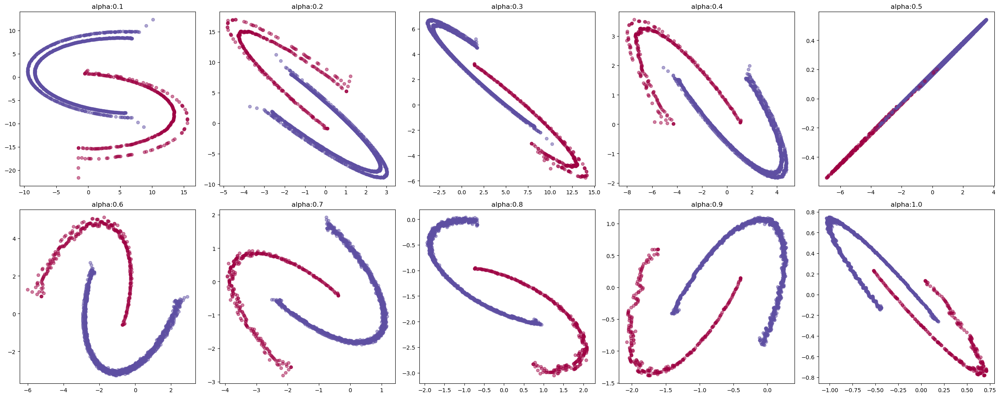

In [21]:
# row_normalized
X,c, A, dataset = get_moons(n_samples=1500, shuffle=True, noise=None, random_state= 0, 
                        n_neighbours = 5, features = 'coordinates', standardize=True, ratio  = 0.8)
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(moons['symmetric_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,0],moons['symmetric_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,1], c = c, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i+1],1)))
plt.tight_layout()
plt.show()

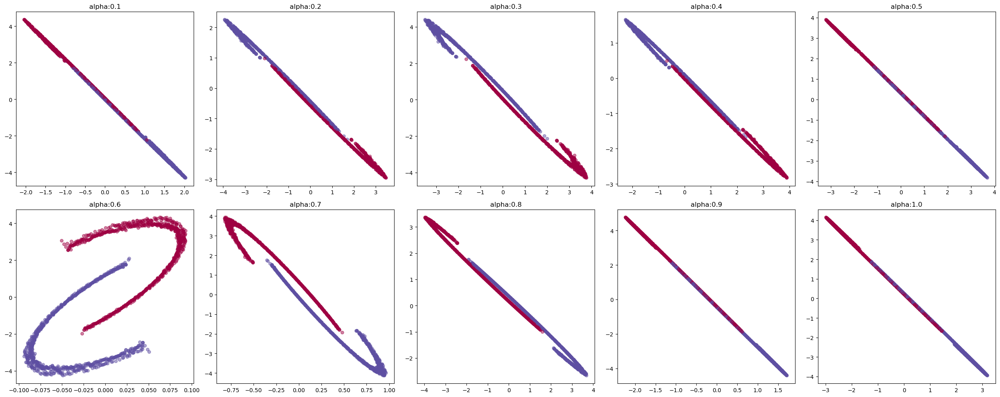

In [15]:
# row_normalized
X,c, A, dataset = get_moons(n_samples=1500, shuffle=True, noise=None, random_state= 0, 
                        n_neighbours = 5, features = 'coordinates', standardize=True)
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(moons['RW_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,0],moons['RW_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,1], c = c, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i+1],1)))
plt.tight_layout()
plt.show()

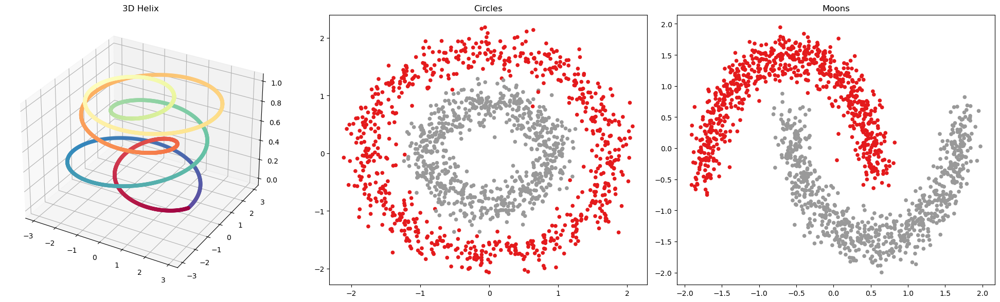

In [74]:
x,y,z,t, A,new_data = get_vhelix(uniform = True, n_samples = 5000)

X,c, _, _  = get_circles(n_samples=1500, shuffle=True, noise=0.1, random_state= 0,factor=0.5,
                        n_neighbours = 5, features = 'coordinates', standardize=True)


Y,d, _, _ = get_moons(n_samples=1500, shuffle=True, noise=0.1, random_state= 0,
                        n_neighbours = 5, features = 'coordinates', standardize=True)


# plotting
fig = plt.figure(figsize = (20,6))
ax = fig.add_subplot(131, projection='3d')
ax.scatter(x,y,z, cmap = plt.cm.Spectral_r, c = t, s= 20)
ax.set_title('3D Helix')
ax = fig.add_subplot(132)
ax.scatter(X[:,0], X[:,1], c=c, cmap = 'Set1', s = 20)
ax.set_title('Circles')
ax = fig.add_subplot(133)
ax.scatter(Y[:,0], Y[:,1], c=d, cmap ='Set1', s = 20)
ax.set_title('Moons')
plt.tight_layout()
plt.show()  # show train_acc and test_acc together
